In [1]:
import json
import os
from pathlib import Path

import numpy as np
import pandas as pd
import polars as pl
from matplotlib import pyplot as plt

from arfcexp.matrices import EfficientMatrixReader

In [2]:
pd.options.display.precision = 4

style_path = os.environ["MPL_STYLE"]
print("matplotlib style:", style_path)
plt.style.use(style_path)

color_cycle = plt.rcParams["axes.prop_cycle"].by_key()["color"]

PLOTW, _ = plt.rcParams["figure.figsize"]
FORMAT = plt.rcParams["savefig.format"]
print(PLOTW, FORMAT)

matplotlib style: /home/aerkent/skarf-experiments/resources/clane.mplstyle
3.42 png


In [3]:
project_root = Path(os.environ["PROJECT_ROOT"])

# Aggregated parquet file with all matrices
parquet_path = "/srv/projects/skarf/data_aggregation/hcp_1200_rfmri_schaefer.parquet"

# Output path for symmetry lookup
output_path = project_root / "resources/matrix_symmetry_lookup.json"

# Initialize memory-efficient matrix reader
matrix_reader = EfficientMatrixReader(parquet_path)

print(f"Parquet path: {parquet_path}")
print(f"Output path: {output_path}")

Parquet path: /srv/projects/skarf/data_aggregation/hcp_1200_rfmri_schaefer.parquet
Output path: /home/aerkent/skarf-experiments/resources/matrix_symmetry_lookup.json


**Note on caching:** This notebook caches expensive computations to avoid redundant processing:
- Symmetry checks are cached to `output/matrix_symmetry_results_cache.pkl`
- SPI_info.csv is downloaded once to `output/SPI_info.csv`
- Results are only saved when data is newly computed

To force recomputation, delete the cache files.

In [4]:
# # Optional: Clear cache to force recomputation
# # Uncomment and run this cell if you want to recompute everything

# cache_files = [
#     project_root / "output/matrix_symmetry_results_cache.pkl",
#     project_root / "output/matrix_symmetry_detailed.csv",
#     project_root / "output/pyspi_symmetry_comparison.csv",
# ]
# for f in cache_files:
#     if f.exists():
#         f.unlink()
#         print(f"Deleted: {f}")
# print("Cache cleared!")

## Load and explore data

In [5]:
# Load parquet file lazily
df = pl.scan_parquet(parquet_path)

# Get schema
print("Schema:")
print(df.collect_schema())

# Get basic info
print("\nBasic info:")
print(df.select([pl.col("method").n_unique(), pl.col("func").n_unique(), pl.len()]).collect())

Schema:
Schema([('method', String), ('func_id', Int32), ('sub_id', Int32), ('func', String), ('sub', String), ('ses', UInt8), ('run', UInt8), ('success', Boolean), ('run_time', Float32), ('peak_mem_mb', Float32), ('err', String), ('mat', List(Float32)), ('train_score', Float32), ('val_score', Float32), ('test_score', Float32), ('scores', List(Float32)), ('lag', Int64)])

Basic info:
shape: (1, 3)
┌────────┬──────┬────────┐
│ method ┆ func ┆ len    │
│ ---    ┆ ---  ┆ ---    │
│ u32    ┆ u32  ┆ u32    │
╞════════╪══════╪════════╡
│ 2      ┆ 161  ┆ 596532 │
└────────┴──────┴────────┘


In [6]:
# Get list of all method/func combinations
method_func_list = (
    df.select(["method", "func"])
    .unique()
    .sort(["method", "func"])
    .collect()
)

print(f"Total method/func combinations: {len(method_func_list)}")
print(method_func_list)

Total method/func combinations: 161
shape: (161, 2)
┌────────┬─────────────────────────────────┐
│ method ┆ func                            │
│ ---    ┆ ---                             │
│ str    ┆ str                             │
╞════════╪═════════════════════════════════╡
│ pyspi  ┆ bary_euclidean_max              │
│ pyspi  ┆ bary_euclidean_mean             │
│ pyspi  ┆ ce_gaussian                     │
│ pyspi  ┆ ce_kernel_W-0.5                 │
│ pyspi  ┆ cohmag_multitaper_max_fs-1_fmi… │
│ …      ┆ …                               │
│ skarf  ┆ linear_pca-ridge                │
│ skarf  ┆ linear_pls                      │
│ skarf  ┆ linear_ridge                    │
│ skarf  ┆ prec_empirical                  │
│ skarf  ┆ prec_graphicallasso             │
└────────┴─────────────────────────────────┘


## Check symmetry for each method/func

In [7]:
def is_matrix_symmetric(mat, rtol=1e-3, atol=1e-3):
    """
    Check if a matrix is symmetric.
    
    Parameters
    ----------
    mat : np.ndarray
        Matrix to check (flattened or 2D)
    rtol : float
        Relative tolerance for np.allclose
    atol : float
        Absolute tolerance for np.allclose
    
    Returns
    -------
    bool
        True if matrix is symmetric
    """
    # Handle flattened matrices
    if mat.ndim == 1:
        # Assume square matrix, compute dimension
        n = int(np.sqrt(len(mat)))
        if n * n != len(mat):
            raise ValueError(f"Cannot reshape flattened array of length {len(mat)} to square matrix")
        mat = mat.reshape(n, n)
    
    # Check symmetry, allowing NaN values on diagonal
    return np.allclose(mat, mat.T, rtol=rtol, atol=atol, equal_nan=True)


def check_method_symmetry(method, func, reader=None, n_samples=10, *, matrices=None):
    """
    Check if a method/func combination produces symmetric matrices.
    
    Parameters
    ----------
    method : str
        Method name ("pyspi" or "skarf")
    func : str
        Function name
    reader : EfficientMatrixReader, optional
        Memory-efficient matrix reader. Required if matrices is not provided.
    n_samples : int
        Number of samples to check (used only when reader is provided).
    matrices : list[np.ndarray], optional
        Pre-loaded matrices (e.g. from batch_get_matrices). Skips reader call.
    
    Returns
    -------
    dict
        Dictionary with symmetry results
    """
    if matrices is None:
        if reader is None:
            raise ValueError("Either reader or matrices must be provided")
        matrices = reader.get_matrices(method, func, success=True, limit=n_samples)
    
    if len(matrices) == 0:
        return {
            "method": method,
            "func": func,
            "is_symmetric": None,
            "n_samples": 0,
            "n_symmetric": 0,
            "consistency": 0.0,
            "n_errors": 0,
            "error": "No successful samples found"
        }
    
    # Check symmetry for each sample
    symmetry_results = []
    errors = []
    for i, mat_array in enumerate(matrices):
        try:
            is_sym = is_matrix_symmetric(mat_array)
            symmetry_results.append(is_sym)
        except Exception as e:
            errors.append(f"Sample {i}: {type(e).__name__}: {str(e)}")
    
    n_symmetric = sum(symmetry_results)
    n_checked = len(symmetry_results)
    n_errors = len(errors)
    
    # Only compute consistency for successfully checked samples
    consistency = n_symmetric / n_checked if n_checked > 0 else 0.0
    
    # Consider symmetric only if ALL successfully checked samples are symmetric
    # If there were errors, is_symmetric will be None
    if n_errors > 0:
        is_symmetric = None
    else:
        is_symmetric = consistency == 1.0
    
    result = {
        "method": method,
        "func": func,
        "is_symmetric": is_symmetric,
        "n_samples": len(matrices),
        "n_symmetric": n_symmetric,
        "consistency": consistency,
        "n_errors": n_errors,
    }
    
    if errors:
        result["error_messages"] = errors
    
    return result

In [8]:
# Check symmetry for all method/func combinations
# Cache results to avoid recomputation
cache_path = project_root / "output/matrix_symmetry_results_cache.pkl"

if cache_path.exists():
    print(f"Loading cached symmetry results from {cache_path}...")
    import pickle
    with open(cache_path, 'rb') as f:
        symmetry_results = pickle.load(f)
    print(f"Loaded {len(symmetry_results)} cached results.")
else:
    # Batch fetch: reads each row group once across all 161 queries
    # instead of re-reading overlapping row groups for each sequential call
    queries = [
        {"method": row["method"], "func": row["func"], "success": True}
        for row in method_func_list.iter_rows(named=True)
    ]
    print(f"Fetching matrices for {len(queries)} combinations in a single parquet pass...")
    all_matrices = matrix_reader.batch_get_matrices(queries, limit=20)
    print(f"Done. Checking symmetry...")

    symmetry_results = []
    for row, mats in zip(method_func_list.iter_rows(named=True), all_matrices):
        result = check_method_symmetry(row["method"], row["func"], matrices=mats)
        symmetry_results.append(result)
        if len(symmetry_results) % 20 == 0:
            print(f"Processed {len(symmetry_results)}/{len(method_func_list)} combinations...")

    print(f"\nCompleted! Processed {len(symmetry_results)} combinations.")

    # Save cache
    print(f"Saving cache to {cache_path}...")
    cache_path.parent.mkdir(parents=True, exist_ok=True)
    import pickle
    with open(cache_path, 'wb') as f:
        pickle.dump(symmetry_results, f)
    print("Cache saved.")

Loading cached symmetry results from /home/aerkent/skarf-experiments/output/matrix_symmetry_results_cache.pkl...
Loaded 161 cached results.


In [9]:
# Convert to DataFrame
symmetry_df = pd.DataFrame(symmetry_results)

print(f"Total combinations: {len(symmetry_df)}")
print(f"Symmetric: {symmetry_df['is_symmetric'].sum()}")
print(f"Non-symmetric: {(~symmetry_df['is_symmetric']).sum()}")
print(f"Failed checks: {symmetry_df['is_symmetric'].isna().sum()}")

symmetry_df.head(10)

Total combinations: 161
Symmetric: 104
Non-symmetric: 57
Failed checks: 0


,method,func,is_symmetric,n_samples,n_symmetric,consistency,n_errors
0,pyspi,bary_euclidean_max,True,20,20,1.0,0
1,pyspi,bary_euclidean_mean,True,20,20,1.0,0
2,pyspi,ce_gaussian,True,20,20,1.0,0
3,pyspi,ce_kernel_W-0.5,False,20,0,0.0,0
4,pyspi,cohmag_multitaper_max_fs-1_fmin-0-25_fmax-0-5,True,20,20,1.0,0
5,pyspi,cohmag_multitaper_max_fs-1_fmin-0_fmax-0-25,True,20,20,1.0,0
6,pyspi,cohmag_multitaper_max_fs-1_fmin-0_fmax-0-5,True,20,20,1.0,0
7,pyspi,cohmag_multitaper_mean_fs-1_fmin-0-25_fmax-0-5,True,20,20,1.0,0
8,pyspi,cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-25,True,20,20,1.0,0
9,pyspi,cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-5,True,20,20,1.0,0


## Analyze results

In [10]:
# Check for inconsistent symmetry
inconsistent = symmetry_df[(symmetry_df['consistency'] > 0.0) & (symmetry_df['consistency'] < 1.0)]

if len(inconsistent) > 0:
    print("WARNING: Found methods with inconsistent symmetry!")
    print(inconsistent[['method', 'func', 'n_samples', 'n_symmetric', 'consistency']])
else:
    print("All methods have consistent symmetry across samples")

All methods have consistent symmetry across samples


In [11]:
# Check for methods with errors during symmetry checking
error_methods = symmetry_df[symmetry_df['n_errors'] > 0]

if len(error_methods) > 0:
    print("WARNING: Found methods with errors during symmetry checking!")
    print(error_methods[['method', 'func', 'n_samples', 'n_errors', 'consistency']])
    print("\nError details:")
    for _, row in error_methods.iterrows():
        if 'error_messages' in row and row['error_messages']:
            print(f"\n{row['method']}__{row['func']}:")
            for err_msg in row['error_messages']:
                print(f"  {err_msg}")
else:
    print("No errors during symmetry checking")


No errors during symmetry checking


In [12]:
# Summary by method type
summary = symmetry_df.groupby(['method', 'is_symmetric']).size().unstack(fill_value=0)
print("Symmetry by method type:")
print(summary)

Symmetry by method type:
is_symmetric  False  True 
method                    
pyspi            45    104
skarf            12      0


In [13]:
# For PySPI, check by category
pyspi_symmetry = symmetry_df[symmetry_df['method'] == 'pyspi'].copy()

# Extract category
pyspi_symmetry['category'] = pyspi_symmetry['func'].str.split('_').str[0]

print("\nPySPI symmetry by category:")
category_summary = pyspi_symmetry.groupby(['category', 'is_symmetric']).size().unstack(fill_value=0)
print(category_summary)

print("\nPySPI categories with ALL symmetric:")
# Check if True column exists, otherwise create empty list
if True in category_summary.columns:
    all_symmetric = category_summary[
        (category_summary[True] > 0) & (category_summary.get(False, pd.Series(0, index=category_summary.index)) == 0)
    ].index.tolist()
else:
    all_symmetric = []
print(all_symmetric)

print("\nPySPI categories with ALL non-symmetric:")
# Check if False column exists, otherwise create empty list
if False in category_summary.columns:
    all_nonsymmetric = category_summary[
        (category_summary[False] > 0) & (category_summary.get(True, pd.Series(0, index=category_summary.index)) == 0)
    ].index.tolist()
else:
    all_nonsymmetric = []
print(all_nonsymmetric)

print("\nPySPI categories with MIXED symmetry:")
# Check if both columns exist
if True in category_summary.columns and False in category_summary.columns:
    mixed = category_summary[
        (category_summary[True] > 0) & (category_summary[False] > 0)
    ].index.tolist()
else:
    mixed = []
print(mixed)



PySPI symmetry by category:
is_symmetric  False  True 
category                  
bary              0      2
ce                1      1
cohmag            0      6
coint             0     11
cov               0      7
dcorr             0      2
dspli             0      6
dswpli            0      6
dtw               0      2
gc                1      0
gd                3      0
gwtau             0      1
icoh              0      6
je                0      3
kendalltau        0      1
lcss              0      2
lmfit             0      5
mi                0      2
pdist             0      6
pec               0      6
phase             6      0
pli               6      0
plv               0      6
ppc               0      6
prec              0      7
psi               3      6
reci              1      0
sgc              12      0
spearmanr         0      1
te                3      0
tlmi              3      0
wpli              6      0
xcorr             0      3

PySPI categories with ALL

## Visualize results

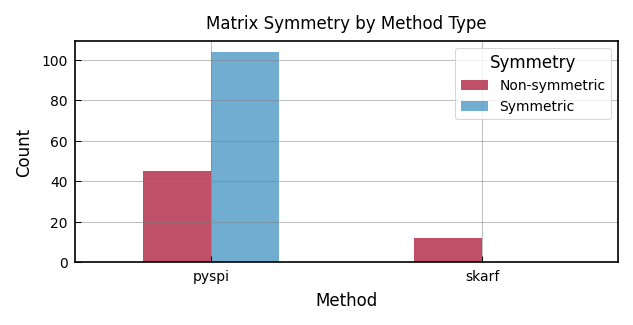

In [14]:
# Bar plot of symmetry by method
f, ax = plt.subplots(1, 1, figsize=(1.2 * PLOTW, 0.6 * PLOTW), layout="constrained")

summary_plot = symmetry_df.groupby(['method', 'is_symmetric']).size().unstack(fill_value=0)
summary_plot.plot(kind='bar', ax=ax, color=[color_cycle[1], color_cycle[0]], alpha=0.7)

ax.set_xlabel('Method', fontsize='medium')
ax.set_ylabel('Count', fontsize='medium')
ax.set_title('Matrix Symmetry by Method Type', fontsize='medium')
ax.legend(['Non-symmetric', 'Symmetric'], title='Symmetry')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

f.savefig(project_root / f"output/matrix_symmetry_by_method.{FORMAT}", bbox_inches="tight")
plt.show()

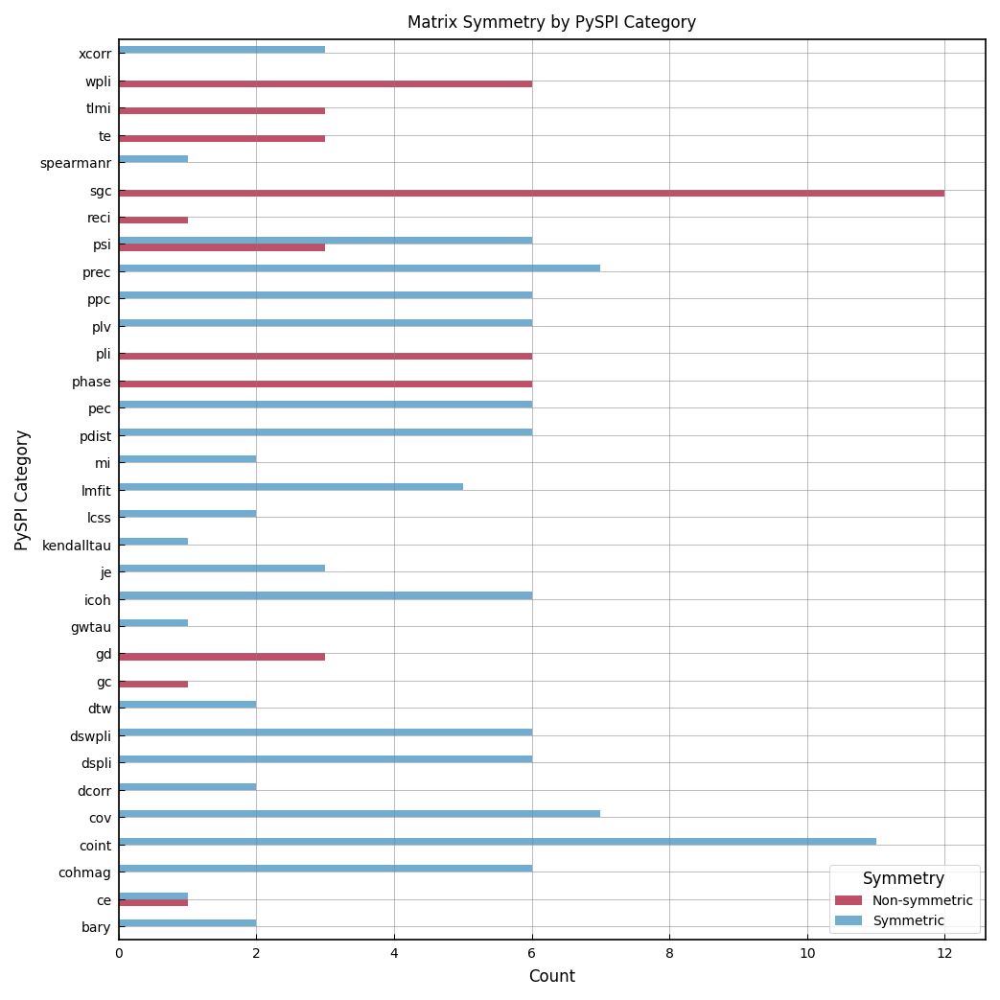

In [15]:
# Bar plot of PySPI symmetry by category
f, ax = plt.subplots(1, 1, figsize=(2 * PLOTW, 2 * PLOTW), layout="constrained")

category_summary.plot(kind='barh', ax=ax, color=[color_cycle[1], color_cycle[0]], alpha=0.7)

ax.set_ylabel('PySPI Category', fontsize='medium')
ax.set_xlabel('Count', fontsize='medium')
ax.set_title('Matrix Symmetry by PySPI Category', fontsize='medium')
ax.legend(['Non-symmetric', 'Symmetric'], title='Symmetry', loc='lower right')

f.savefig(project_root / f"output/matrix_symmetry_pyspi_categories.{FORMAT}", bbox_inches="tight")
plt.show()

Loading sample matrices from mixed symmetry categories...


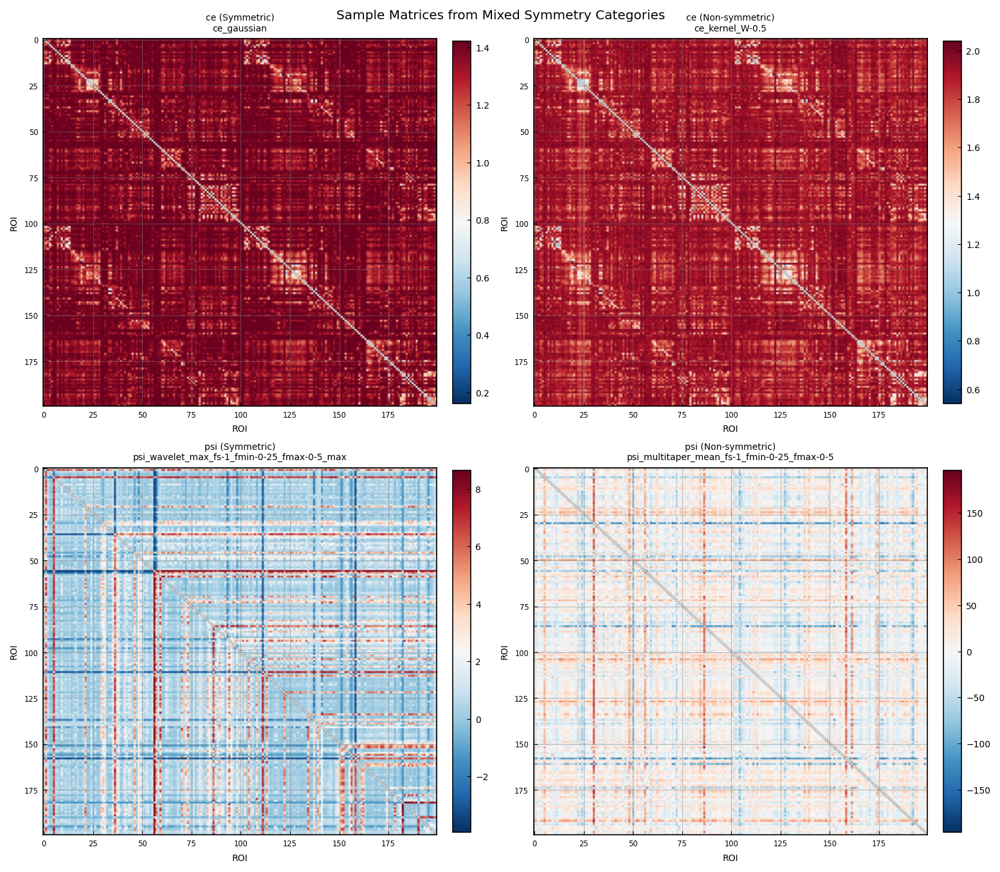

In [16]:
# Visualize sample matrices from mixed symmetry categories
print("Loading sample matrices from mixed symmetry categories...")

mixed_categories = mixed
n_categories = len(mixed_categories)

if n_categories > 0:
    # First pass: determine which funcs are needed per category
    sym_func_per_cat = {}
    nonsym_func_per_cat = {}
    for category in mixed_categories:
        cat_funcs = pyspi_symmetry[pyspi_symmetry['category'] == category]
        sym_funcs = cat_funcs[cat_funcs['is_symmetric'] == True]
        nonsym_funcs = cat_funcs[cat_funcs['is_symmetric'] == False]
        if len(sym_funcs) > 0:
            sym_func_per_cat[category] = sym_funcs['func'].iloc[0]
        if len(nonsym_funcs) > 0:
            nonsym_func_per_cat[category] = nonsym_funcs['func'].iloc[0]

    # Batch fetch all needed funcs in one parquet pass
    all_funcs = list(set(sym_func_per_cat.values()) | set(nonsym_func_per_cat.values()))
    queries = [{"method": "pyspi", "func": f, "success": True} for f in all_funcs]
    batch_results = matrix_reader.batch_get_matrices(queries, limit=1, max_workers=8)
    prefetched = {f: mats for f, mats in zip(all_funcs, batch_results)}

    # For mixed categories, show both symmetric and non-symmetric examples
    n_cols = 2  # One symmetric, one non-symmetric per category
    n_rows = n_categories

    f, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.5 * PLOTW, n_rows * 1.3 * PLOTW),
                           layout="constrained")
    if n_categories == 1:
        axes = axes.reshape(1, -1)

    for row_idx, category in enumerate(mixed_categories):
        # Plot symmetric example
        ax_sym = axes[row_idx, 0]
        func_name = sym_func_per_cat.get(category)
        if func_name is not None:
            matrices = prefetched.get(func_name, [])
            if matrices:
                mat = matrices[0]
                n = int(np.sqrt(len(mat)))
                mat = mat.reshape(n, n)

                im = ax_sym.imshow(mat, cmap='RdBu_r', aspect='auto')
                ax_sym.set_title(f'{category} (Symmetric)\n{func_name}', fontsize='small')
                ax_sym.set_xlabel('ROI', fontsize='small')
                ax_sym.set_ylabel('ROI', fontsize='small')
                ax_sym.tick_params(labelsize='x-small')
                plt.colorbar(im, ax=ax_sym, fraction=0.046, pad=0.04)
            else:
                ax_sym.axis('off')
        else:
            ax_sym.axis('off')

        # Plot non-symmetric example
        ax_nonsym = axes[row_idx, 1]
        func_name = nonsym_func_per_cat.get(category)
        if func_name is not None:
            matrices = prefetched.get(func_name, [])
            if matrices:
                mat = matrices[0]
                n = int(np.sqrt(len(mat)))
                mat = mat.reshape(n, n)

                im = ax_nonsym.imshow(mat, cmap='RdBu_r', aspect='auto')
                ax_nonsym.set_title(f'{category} (Non-symmetric)\n{func_name}', fontsize='small')
                ax_nonsym.set_xlabel('ROI', fontsize='small')
                ax_nonsym.set_ylabel('ROI', fontsize='small')
                ax_nonsym.tick_params(labelsize='x-small')
                plt.colorbar(im, ax=ax_nonsym, fraction=0.046, pad=0.04)
            else:
                ax_nonsym.axis('off')
        else:
            ax_nonsym.axis('off')

    f.suptitle('Sample Matrices from Mixed Symmetry Categories', fontsize='large', y=1.0)
    f.savefig(project_root / f"output/matrix_symmetry_mixed_samples.{FORMAT}",
              bbox_inches="tight", dpi=150)
    plt.show()
else:
    print("No mixed symmetry categories found.")

Loading sample matrices from non-symmetric categories...


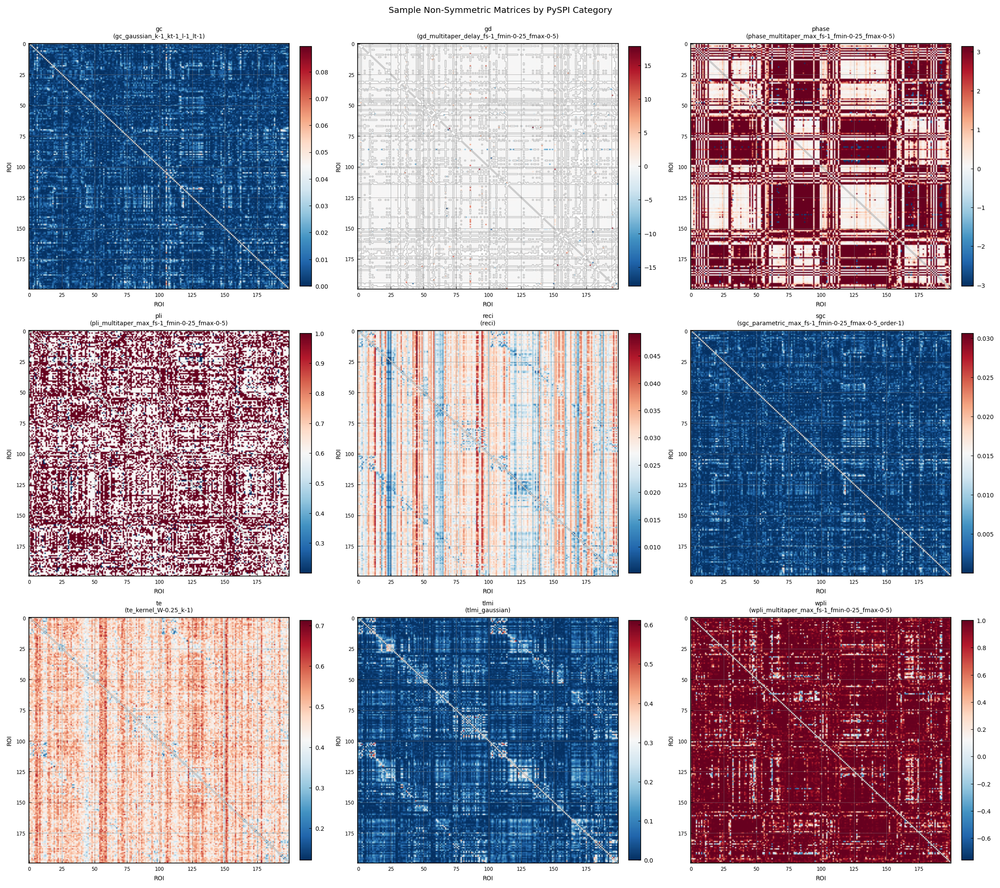

In [17]:
# Visualize sample matrices from non-symmetric categories
print("Loading sample matrices from non-symmetric categories...")

nonsymmetric_categories = all_nonsymmetric
n_categories = len(nonsymmetric_categories)

if n_categories > 0:
    # Collect the representative func for each category (no I/O)
    funcs_per_cat = [
        pyspi_symmetry[pyspi_symmetry['category'] == cat]['func'].iloc[0]
        for cat in nonsymmetric_categories
    ]

    # Batch fetch all in one parquet pass
    queries = [{"method": "pyspi", "func": f, "success": True} for f in funcs_per_cat]
    batch_results = matrix_reader.batch_get_matrices(queries, limit=1, max_workers=8)
    prefetched = {f: mats for f, mats in zip(funcs_per_cat, batch_results)}

    # Determine grid layout
    n_cols = 3
    n_rows = (n_categories + n_cols - 1) // n_cols

    f, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.5 * PLOTW, n_rows * 1.3 * PLOTW),
                           layout="constrained")
    axes = axes.flatten() if n_categories > 1 else [axes]

    for idx, (category, funcs_in_cat) in enumerate(zip(nonsymmetric_categories, funcs_per_cat)):
        ax = axes[idx]
        matrices = prefetched.get(funcs_in_cat, [])

        if matrices:
            mat = matrices[0]
            n = int(np.sqrt(len(mat)))
            mat = mat.reshape(n, n)

            im = ax.imshow(mat, cmap='RdBu_r', aspect='auto')
            ax.set_title(f'{category}\n({funcs_in_cat})', fontsize='small')
            ax.set_xlabel('ROI', fontsize='small')
            ax.set_ylabel('ROI', fontsize='small')
            ax.tick_params(labelsize='x-small')
            plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        else:
            ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'{category}', fontsize='small')
            ax.axis('off')

    # Hide unused subplots
    for idx in range(n_categories, len(axes)):
        axes[idx].axis('off')

    f.suptitle('Sample Non-Symmetric Matrices by PySPI Category', fontsize='large', y=1.02)
    f.savefig(project_root / f"output/matrix_symmetry_nonsymmetric_samples.{FORMAT}",
              bbox_inches="tight", dpi=150)
    plt.show()
else:
    print("No non-symmetric categories found.")

## Create and save symmetry lookup

In [18]:
# Create lookup dictionary
# Format: {"method__func": is_symmetric}

symmetry_lookup = {}

for _, row in symmetry_df.iterrows():
    method = row['method']
    func = row['func']
    is_sym = row['is_symmetric']
    
    key = f"{method}__{func}"
    symmetry_lookup[key] = bool(is_sym)

print(f"Created lookup with {len(symmetry_lookup)} entries")
print(f"Symmetric: {sum(symmetry_lookup.values())}")
print(f"Non-symmetric: {sum(not v for v in symmetry_lookup.values())}")

print("\nExample entries:")
for i, (key, value) in enumerate(list(symmetry_lookup.items())[:10]):
    print(f"  {key}: {value}")

Created lookup with 161 entries
Symmetric: 104
Non-symmetric: 57

Example entries:
  pyspi__bary_euclidean_max: True
  pyspi__bary_euclidean_mean: True
  pyspi__ce_gaussian: True
  pyspi__ce_kernel_W-0.5: False
  pyspi__cohmag_multitaper_max_fs-1_fmin-0-25_fmax-0-5: True
  pyspi__cohmag_multitaper_max_fs-1_fmin-0_fmax-0-25: True
  pyspi__cohmag_multitaper_max_fs-1_fmin-0_fmax-0-5: True
  pyspi__cohmag_multitaper_mean_fs-1_fmin-0-25_fmax-0-5: True
  pyspi__cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-25: True
  pyspi__cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-5: True


In [19]:
# Save lookup file (only if it doesn't exist or data has changed)
if not output_path.exists() or 'symmetry_results' in locals():
    output_path.parent.mkdir(parents=True, exist_ok=True)
    
    with open(output_path, 'w') as f:
        json.dump(symmetry_lookup, f, indent=2)
    
    print(f"Saved symmetry lookup to: {output_path}")
else:
    print(f"Symmetry lookup already exists at: {output_path}")
    print("(Skipping save since data was loaded from cache)")

Saved symmetry lookup to: /home/aerkent/skarf-experiments/resources/matrix_symmetry_lookup.json


In [20]:
# Save detailed CSV (only if it doesn't exist or data has changed)
csv_path = project_root / "output/matrix_symmetry_detailed.csv"
if not csv_path.exists() or 'symmetry_results' in locals():
    symmetry_df.to_csv(csv_path, index=False)
    print(f"Saved detailed results to: {csv_path}")
else:
    print(f"Detailed results already exist at: {csv_path}")
    print("(Skipping save since data was loaded from cache)")

Saved detailed results to: /home/aerkent/skarf-experiments/output/matrix_symmetry_detailed.csv


## Create and save antisymmetry lookup

For antisymmetric matrices (M = -M^T), the lower triangle is just the negative of the upper triangle. This means only the upper triangle needs to be stored/analyzed, similar to symmetric matrices.

In [21]:
def is_matrix_antisymmetric(mat, rtol=1e-3, atol=1e-3):
    """Check if a matrix is anti-symmetric (M = -M^T)."""
    if mat.ndim == 1:
        n = int(np.sqrt(len(mat)))
        if n * n != len(mat):
            raise ValueError(f"Cannot reshape flattened array of length {len(mat)} to square matrix")
        mat = mat.reshape(n, n)
    
    # Check if M + M^T ≈ 0
    return np.allclose(mat, -mat.T, rtol=rtol, atol=atol, equal_nan=True)


def check_method_antisymmetry(method, func, reader=None, n_samples=10, *, matrices=None):
    """
    Check if a method/func combination produces anti-symmetric matrices.
    
    Parameters
    ----------
    method : str
        Method name ("pyspi" or "skarf")
    func : str
        Function name
    reader : EfficientMatrixReader, optional
        Memory-efficient matrix reader. Required if matrices is not provided.
    n_samples : int
        Number of samples to check (used only when reader is provided).
    matrices : list[np.ndarray], optional
        Pre-loaded matrices (e.g. from batch_get_matrices). Skips reader call.
    
    Returns
    -------
    dict
        Dictionary with antisymmetry results
    """
    if matrices is None:
        if reader is None:
            raise ValueError("Either reader or matrices must be provided")
        matrices = reader.get_matrices(method, func, success=True, limit=n_samples)
    
    if len(matrices) == 0:
        return {
            "method": method,
            "func": func,
            "is_antisymmetric": None,
            "n_samples": 0,
            "n_antisymmetric": 0,
            "consistency": 0.0,
            "n_errors": 0,
            "error": "No successful samples found"
        }
    
    # Check antisymmetry for each sample
    antisymmetry_results = []
    errors = []
    for i, mat_array in enumerate(matrices):
        try:
            is_antisym = is_matrix_antisymmetric(mat_array)
            antisymmetry_results.append(is_antisym)
        except Exception as e:
            errors.append(f"Sample {i}: {type(e).__name__}: {str(e)}")
    
    n_antisymmetric = sum(antisymmetry_results)
    n_checked = len(antisymmetry_results)
    n_errors = len(errors)
    
    # Only compute consistency for successfully checked samples
    consistency = n_antisymmetric / n_checked if n_checked > 0 else 0.0
    
    # Consider antisymmetric only if ALL successfully checked samples are antisymmetric
    if n_errors > 0:
        is_antisymmetric = None
    else:
        is_antisymmetric = consistency == 1.0
    
    result = {
        "method": method,
        "func": func,
        "is_antisymmetric": is_antisymmetric,
        "n_samples": len(matrices),
        "n_antisymmetric": n_antisymmetric,
        "consistency": consistency,
        "n_errors": n_errors,
    }
    
    if errors:
        result["error_messages"] = errors
    
    return result

In [22]:
# Check antisymmetry for all method/func combinations
# Cache results to avoid recomputation
antisym_cache_path = project_root / "output/matrix_antisymmetry_results_cache.pkl"

if antisym_cache_path.exists():
    print(f"Loading cached antisymmetry results from {antisym_cache_path}...")
    import pickle
    with open(antisym_cache_path, 'rb') as f:
        antisymmetry_results = pickle.load(f)
    print(f"Loaded {len(antisymmetry_results)} cached results.")
else:
    if 'all_matrices' not in locals():
        queries = [
            {"method": row["method"], "func": row["func"], "success": True}
            for row in method_func_list.iter_rows(named=True)
        ]
        print(f"Fetching matrices for {len(queries)} combinations in a single parquet pass...")
        all_matrices = matrix_reader.batch_get_matrices(queries, limit=20)
        print("Done.")

    print(f"Checking antisymmetry for {len(method_func_list)} combinations...")
    antisymmetry_results = []
    for row, mats in zip(method_func_list.iter_rows(named=True), all_matrices):
        result = check_method_antisymmetry(row["method"], row["func"], matrices=mats)
        antisymmetry_results.append(result)
        if len(antisymmetry_results) % 20 == 0:
            print(f"Processed {len(antisymmetry_results)}/{len(method_func_list)} combinations...")

    print(f"\nCompleted! Processed {len(antisymmetry_results)} combinations.")

    # Save cache
    print(f"Saving cache to {antisym_cache_path}...")
    antisym_cache_path.parent.mkdir(parents=True, exist_ok=True)
    import pickle
    with open(antisym_cache_path, 'wb') as f:
        pickle.dump(antisymmetry_results, f)
    print("Cache saved.")

Loading cached antisymmetry results from /home/aerkent/skarf-experiments/output/matrix_antisymmetry_results_cache.pkl...
Loaded 161 cached results.


In [23]:
# Convert to DataFrame and analyze
antisymmetry_df = pd.DataFrame(antisymmetry_results)

print(f"Total combinations: {len(antisymmetry_df)}")
print(f"Antisymmetric: {antisymmetry_df['is_antisymmetric'].sum()}")
print(f"Non-antisymmetric: {(~antisymmetry_df['is_antisymmetric']).sum()}")
print(f"Failed checks: {antisymmetry_df['is_antisymmetric'].isna().sum()}")

# Show antisymmetric metrics
antisym_metrics = antisymmetry_df[antisymmetry_df['is_antisymmetric'] == True]
print(f"\nAntisymmetric metrics ({len(antisym_metrics)}):")
if len(antisym_metrics) > 0:
    for _, row in antisym_metrics.iterrows():
        print(f"  {row['method']}__{row['func']}")
else:
    print("  None found")

Total combinations: 161
Antisymmetric: 14
Non-antisymmetric: 147
Failed checks: 0

Antisymmetric metrics (14):
  pyspi__bary_euclidean_mean
  pyspi__gd_multitaper_delay_fs-1_fmin-0-25_fmax-0-5
  pyspi__gd_multitaper_delay_fs-1_fmin-0_fmax-0-25
  pyspi__gd_multitaper_delay_fs-1_fmin-0_fmax-0-5
  pyspi__phase_multitaper_mean_fs-1_fmin-0-25_fmax-0-5
  pyspi__pli_multitaper_mean_fs-1_fmin-0-25_fmax-0-5
  pyspi__pli_multitaper_mean_fs-1_fmin-0_fmax-0-25
  pyspi__pli_multitaper_mean_fs-1_fmin-0_fmax-0-5
  pyspi__psi_multitaper_mean_fs-1_fmin-0-25_fmax-0-5
  pyspi__psi_multitaper_mean_fs-1_fmin-0_fmax-0-25
  pyspi__psi_multitaper_mean_fs-1_fmin-0_fmax-0-5
  pyspi__wpli_multitaper_mean_fs-1_fmin-0-25_fmax-0-5
  pyspi__wpli_multitaper_mean_fs-1_fmin-0_fmax-0-25
  pyspi__wpli_multitaper_mean_fs-1_fmin-0_fmax-0-5


In [24]:
# Create antisymmetry lookup dictionary
# Format: {"method__func": is_antisymmetric}

antisymmetry_lookup = {}

for _, row in antisymmetry_df.iterrows():
    method = row['method']
    func = row['func']
    is_antisym = row['is_antisymmetric']
    
    key = f"{method}__{func}"
    antisymmetry_lookup[key] = bool(is_antisym) if pd.notna(is_antisym) else False

print(f"Created antisymmetry lookup with {len(antisymmetry_lookup)} entries")

Created antisymmetry lookup with 161 entries


In [25]:
# Save antisymmetry lookup file
antisymmetry_output_path = project_root / "resources/matrix_antisymmetry_lookup.json"

if not antisymmetry_output_path.exists() or 'antisymmetry_results' in locals():
    antisymmetry_output_path.parent.mkdir(parents=True, exist_ok=True)
    
    with open(antisymmetry_output_path, 'w') as f:
        json.dump(antisymmetry_lookup, f, indent=2)
    
    print(f"Saved antisymmetry lookup to: {antisymmetry_output_path}")
else:
    print(f"Antisymmetry lookup already exists at: {antisymmetry_output_path}")
    print("(Skipping save since data was loaded from cache)")

# Also save detailed antisymmetry CSV
antisym_csv_path = project_root / "output/matrix_antisymmetry_detailed.csv"
if not antisym_csv_path.exists() or 'antisymmetry_results' in locals():
    antisymmetry_df.to_csv(antisym_csv_path, index=False)
    print(f"Saved detailed antisymmetry results to: {antisym_csv_path}")

Saved antisymmetry lookup to: /home/aerkent/skarf-experiments/resources/matrix_antisymmetry_lookup.json
Saved detailed antisymmetry results to: /home/aerkent/skarf-experiments/output/matrix_antisymmetry_detailed.csv


In [26]:
n_symmetric = sum(symmetry_lookup.values())
n_antisymmetric = sum(antisymmetry_lookup.values())
n_total = len(symmetry_lookup)
n_general = n_total - n_symmetric - n_antisymmetric

print(f"""
Matrix structure distribution:
  • Symmetric (M = M^T):       {n_symmetric:3d} metrics ({100*n_symmetric/n_total:.1f}%)
  • Antisymmetric (M = -M^T):  {n_antisymmetric:3d} metrics ({100*n_antisymmetric/n_total:.1f}%)
  • General (neither):         {n_general:3d} metrics ({100*n_general/n_total:.1f}%)
""")



Matrix structure distribution:
  • Symmetric (M = M^T):       104 metrics (64.6%)
  • Antisymmetric (M = -M^T):   14 metrics (8.7%)
  • General (neither):          43 metrics (26.7%)



## Compare with documented PySPI symmetry

Investigate discrepancies between documented and computed symmetry properties.

In [27]:
# Download and load SPI_info.csv from PySPI paper repository
import urllib.request

spi_info_url = "https://raw.githubusercontent.com/DynamicsAndNeuralSystems/pyspi_paper_code/main/data/SPI_info.csv"
spi_info_path = project_root / "output/SPI_info.csv"

# Download if not exists
if not spi_info_path.exists():
    print(f"Downloading SPI_info.csv from {spi_info_url}...")
    urllib.request.urlretrieve(spi_info_url, spi_info_path)
    print(f"Saved to {spi_info_path}")
else:
    print(f"Using cached SPI_info.csv at {spi_info_path}")

# Load SPI info
spi_info = pd.read_csv(spi_info_path)
print(f"\nLoaded {len(spi_info)} SPIs from documentation")
print(f"Columns: {list(spi_info.columns)}")
print(f"\nDirectionality counts:")
print(spi_info['Directionality'].value_counts())

Using cached SPI_info.csv at /home/aerkent/skarf-experiments/output/SPI_info.csv

Loaded 237 SPIs from documentation
Columns: ['SPI', 'Directionality', 'Literature_category', 'Module']

Directionality counts:
Directionality
Undirected    139
Directed       98
Name: count, dtype: int64


In [28]:
# Create mapping from SPI_info
# Convert directionality to boolean (Undirected = True/symmetric, Directed = False/non-symmetric)
spi_info['documented_symmetric'] = (spi_info['Directionality'] == 'Undirected')

# Create comparison dataframe for PySPI metrics
pyspi_comparison = symmetry_df[symmetry_df['method'] == 'pyspi'].copy()
pyspi_comparison = pyspi_comparison[['func', 'is_symmetric']].rename(columns={'is_symmetric': 'computed_symmetric'})

# Merge with documented values
pyspi_comparison = pyspi_comparison.merge(
    spi_info[['SPI', 'documented_symmetric', 'Directionality', 'Literature_category', 'Module']], 
    left_on='func', 
    right_on='SPI', 
    how='left'
)

# Filter to only keep metrics that are documented in SPI_info.csv
# (Exclude metrics added to PySPI later that aren't in the documentation)
n_total = len(pyspi_comparison)
n_documented = pyspi_comparison['SPI'].notna().sum()
n_undocumented = n_total - n_documented

print(f"Total PySPI metrics computed: {n_total}")
print(f"Metrics with documentation in SPI_info.csv: {n_documented}")
print(f"Metrics without documentation (excluded from analysis): {n_undocumented}")

if n_undocumented > 0:
    undocumented_metrics = pyspi_comparison[pyspi_comparison['SPI'].isna()]['func'].tolist()
    print(f"\nUndocumented metrics (first 10): {undocumented_metrics[:10]}")

# Filter to only documented metrics for mismatch analysis
pyspi_comparison_documented = pyspi_comparison[pyspi_comparison['SPI'].notna()].copy()

# Identify discrepancies (only for documented metrics)
pyspi_comparison_documented['mismatch'] = (
    pyspi_comparison_documented['computed_symmetric'] != pyspi_comparison_documented['documented_symmetric']
)

print(f"\nMismatches found (documented metrics only): {pyspi_comparison_documented['mismatch'].sum()}")

# Save comparison for future reference (full comparison including undocumented)
comparison_path = project_root / "output/pyspi_symmetry_comparison.csv"
if not comparison_path.exists() or 'symmetry_results' in locals():
    pyspi_comparison.to_csv(comparison_path, index=False)
    print(f"\nSaved full comparison to: {comparison_path}")

# Save documented-only comparison
comparison_documented_path = project_root / "output/pyspi_symmetry_comparison_documented.csv"
if not comparison_documented_path.exists() or 'symmetry_results' in locals():
    pyspi_comparison_documented.to_csv(comparison_documented_path, index=False)
    print(f"Saved documented-only comparison to: {comparison_documented_path}")

pyspi_comparison_documented.head(10)

Total PySPI metrics computed: 149
Metrics with documentation in SPI_info.csv: 136
Metrics without documentation (excluded from analysis): 13

Undocumented metrics (first 10): ['bary_euclidean_mean', 'gwtau', 'lmfit_Lasso', 'pdist_braycurtis', 'pdist_canberra', 'pdist_chebyshev', 'pdist_cityblock', 'pdist_cosine', 'pdist_euclidean', 'sgc_parametric_max_fs-1_fmin-1e-05_fmax-0-5_order-1']

Mismatches found (documented metrics only): 32

Saved full comparison to: /home/aerkent/skarf-experiments/output/pyspi_symmetry_comparison.csv
Saved documented-only comparison to: /home/aerkent/skarf-experiments/output/pyspi_symmetry_comparison_documented.csv


,func,computed_symmetric,SPI,documented_symmetric,Directionality,Literature_category,Module,mismatch
0,bary_euclidean_max,True,bary_euclidean_max,True,Undirected,distance,M14,False
2,ce_gaussian,True,ce_gaussian,True,Undirected,infotheory,M14,False
3,ce_kernel_W-0.5,False,ce_kernel_W-0.5,True,Undirected,infotheory,M14,True
4,cohmag_multitaper_max_fs-1_fmin-0-25_fmax-0-5,True,cohmag_multitaper_max_fs-1_fmin-0-25_fmax-0-5,True,Undirected,spectral,M12,False
5,cohmag_multitaper_max_fs-1_fmin-0_fmax-0-25,True,cohmag_multitaper_max_fs-1_fmin-0_fmax-0-25,True,Undirected,spectral,M12,False
6,cohmag_multitaper_max_fs-1_fmin-0_fmax-0-5,True,cohmag_multitaper_max_fs-1_fmin-0_fmax-0-5,True,Undirected,spectral,M12,False
7,cohmag_multitaper_mean_fs-1_fmin-0-25_fmax-0-5,True,cohmag_multitaper_mean_fs-1_fmin-0-25_fmax-0-5,True,Undirected,spectral,M12,False
8,cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-25,True,cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-25,True,Undirected,spectral,M12,False
9,cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-5,True,cohmag_multitaper_mean_fs-1_fmin-0_fmax-0-5,True,Undirected,spectral,M12,False
10,coint_aeg_tstat_trend-c_autolag-aic_maxlag-10,True,coint_aeg_tstat_trend-c_autolag-aic_maxlag-10,True,Undirected,misc,M13,False


In [29]:
# Show all mismatches (only for documented metrics)
mismatches = pyspi_comparison_documented[pyspi_comparison_documented['mismatch'] == True].copy()

if len(mismatches) > 0:
    print(f"Found {len(mismatches)} metrics with symmetry mismatches:\n")
    
    # Sort by category for easier reading
    mismatches['category'] = mismatches['func'].str.split('_').str[0]
    mismatches_sorted = mismatches.sort_values(['Literature_category', 'category', 'func'])
    
    # Display with clear formatting
    display_cols = ['func', 'computed_symmetric', 'documented_symmetric', 'Directionality', 'Literature_category']
    print(mismatches_sorted[display_cols].to_string(index=False))
    
    # Summarize by direction of mismatch
    print("\n" + "="*80)
    print("\nMismatch types:")
    
    # Symmetric in data but documented as directed
    symmetric_mismatch = mismatches[
        (mismatches['computed_symmetric'] == True) & 
        (mismatches['documented_symmetric'] == False)
    ]
    print(f"\nComputed SYMMETRIC but documented DIRECTED: {len(symmetric_mismatch)}")
    if len(symmetric_mismatch) > 0:
        print("  Metrics:", symmetric_mismatch['func'].tolist())
    
    # Non-symmetric in data but documented as undirected
    directed_mismatch = mismatches[
        (mismatches['computed_symmetric'] == False) & 
        (mismatches['documented_symmetric'] == True)
    ]
    print(f"\nComputed NON-SYMMETRIC but documented UNDIRECTED: {len(directed_mismatch)}")
    if len(directed_mismatch) > 0:
        print("  Metrics:", directed_mismatch['func'].tolist())
else:
    print("No mismatches found!")

Found 32 metrics with symmetry mismatches:

                                         func  computed_symmetric documented_symmetric Directionality Literature_category
                              ce_kernel_W-0.5               False                 True     Undirected          infotheory
                                tlmi_gaussian               False                 True     Undirected          infotheory
                           tlmi_kernel_W-0.25               False                 True     Undirected          infotheory
                            tlmi_kraskov_NN-4               False                 True     Undirected          infotheory
                          lmfit_BayesianRidge                True                False       Directed                misc
                             lmfit_ElasticNet                True                False       Directed                misc
                                  lmfit_Ridge                True                False       Directed 

In [41]:
# Analyze by SPI category (prefix)
print("Mismatches by SPI category:\n")

if len(mismatches) > 0:
    mismatch_by_category = mismatches.groupby('category').agg({
        'func': 'count',
        'computed_symmetric': lambda x: f"{int(x.sum())}/{len(x)} symmetric",
        'documented_symmetric': lambda x: f"{int(x.sum())}/{len(x)} documented as undirected",
        'Literature_category': 'first'
    }).rename(columns={'func': 'count'})
    
    print(mismatch_by_category.to_string())
    
    # Check specific problematic categories mentioned by user
    print("\n" + "="*80)
    print("\nProblematic categories:")
    
    problematic_prefixes = ['ce', 'tlmi', 'pli', 'phase', 'wpli', 'psi']
    
    for prefix in problematic_prefixes:
        prefix_mismatches = mismatches[mismatches['category'] == prefix]
        if len(prefix_mismatches) > 0:
            print(f"\n{prefix}_ metrics ({len(prefix_mismatches)} mismatches):")
            print(f"  Computed: {prefix_mismatches['computed_symmetric'].unique()}")
            print(f"  Documented: {prefix_mismatches['Directionality'].unique()}")
            print(f"  Literature category: {prefix_mismatches['Literature_category'].unique()}")
else:
    print("No mismatches to analyze.")

Mismatches by SPI category:

          count computed_symmetric          documented_symmetric Literature_category
category                                                                            
ce            1      0/1 symmetric  1/1 documented as undirected          infotheory
lmfit         4      4/4 symmetric  0/4 documented as undirected                misc
phase         6      0/6 symmetric  6/6 documented as undirected            spectral
pli           6      0/6 symmetric  6/6 documented as undirected            spectral
psi           6      6/6 symmetric  0/6 documented as undirected            spectral
tlmi          3      0/3 symmetric  3/3 documented as undirected          infotheory
wpli          6      0/6 symmetric  6/6 documented as undirected            spectral


Problematic categories:

ce_ metrics (1 mismatches):
  Computed: [False]
  Documented: ['Undirected']
  Literature category: ['infotheory']

tlmi_ metrics (3 mismatches):
  Computed: [False]
  Documented:

### Investigate specific metrics

In [44]:
# Examine specific problematic metrics from actual mismatches
if len(mismatches) > 0:
    # Get actual mismatched metrics, categorized by type
    
    # Metrics that are computed as NON-SYMMETRIC but documented as UNDIRECTED
    directed_computed_undirected_doc = mismatches[
        (mismatches['computed_symmetric'] == False) & 
        (mismatches['documented_symmetric'] == True)
    ]['func'].tolist()
    
    # Metrics that are computed as SYMMETRIC but documented as DIRECTED  
    symmetric_computed_directed_doc = mismatches[
        (mismatches['computed_symmetric'] == True) & 
        (mismatches['documented_symmetric'] == False)
    ]['func'].tolist()
    
    print("Actual mismatched metrics found:")
    
    print(f"\n1. Computed NON-SYMMETRIC but documented as UNDIRECTED: {len(directed_computed_undirected_doc)}")
    if len(directed_computed_undirected_doc) > 0:
        for metric in directed_computed_undirected_doc:
            row = mismatches[mismatches['func'] == metric].iloc[0]
            print(f"    • {metric}")
            print(f"      Category: {row['Literature_category']}")
    
    print(f"\n2. Computed SYMMETRIC but documented as DIRECTED: {len(symmetric_computed_directed_doc)}")
    if len(symmetric_computed_directed_doc) > 0:
        for metric in symmetric_computed_directed_doc:
            row = mismatches[mismatches['func'] == metric].iloc[0]
            print(f"    • {metric}")
            print(f"      Category: {row['Literature_category']}")    
else:
    print("No mismatches found!")

Actual mismatched metrics found:

1. Computed NON-SYMMETRIC but documented as UNDIRECTED: 22
    • ce_kernel_W-0.5
      Category: infotheory
    • phase_multitaper_max_fs-1_fmin-0-25_fmax-0-5
      Category: spectral
    • phase_multitaper_max_fs-1_fmin-0_fmax-0-25
      Category: spectral
    • phase_multitaper_max_fs-1_fmin-0_fmax-0-5
      Category: spectral
    • phase_multitaper_mean_fs-1_fmin-0-25_fmax-0-5
      Category: spectral
    • phase_multitaper_mean_fs-1_fmin-0_fmax-0-25
      Category: spectral
    • phase_multitaper_mean_fs-1_fmin-0_fmax-0-5
      Category: spectral
    • pli_multitaper_max_fs-1_fmin-0-25_fmax-0-5
      Category: spectral
    • pli_multitaper_max_fs-1_fmin-0_fmax-0-25
      Category: spectral
    • pli_multitaper_max_fs-1_fmin-0_fmax-0-5
      Category: spectral
    • pli_multitaper_mean_fs-1_fmin-0-25_fmax-0-5
      Category: spectral
    • pli_multitaper_mean_fs-1_fmin-0_fmax-0-25
      Category: spectral
    • pli_multitaper_mean_fs-1_fmin-0_fmax-0

Loading sample matrices from mismatched metrics...


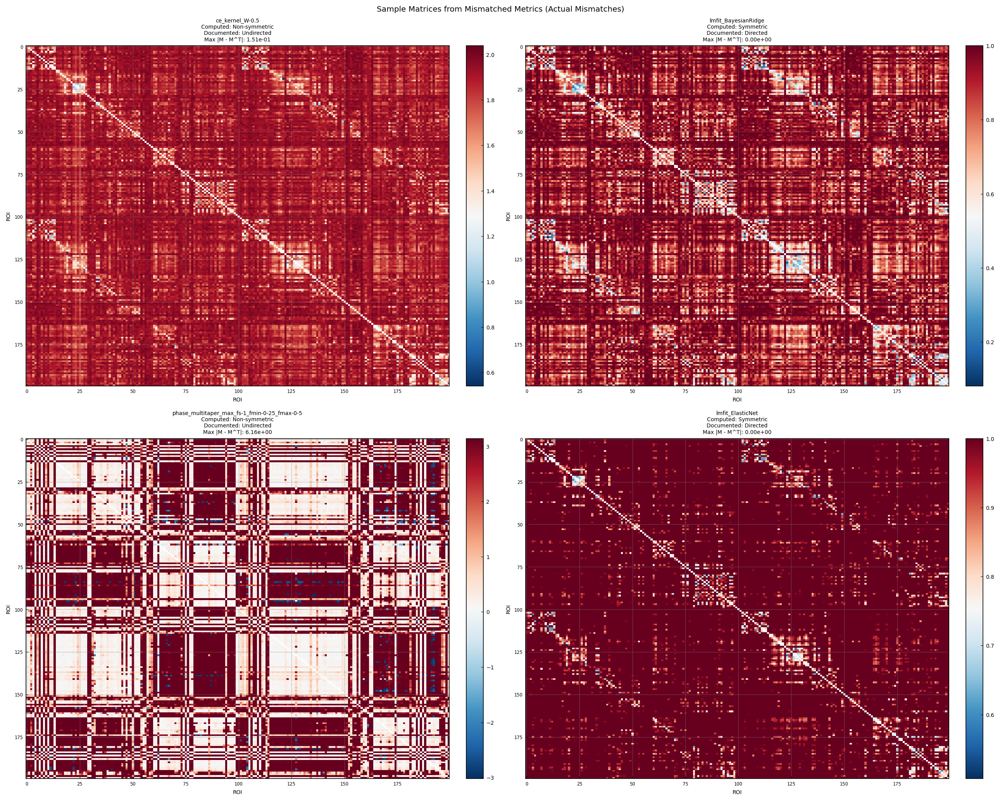

In [32]:
# Visualize sample matrices from actual mismatched metrics
print("Loading sample matrices from mismatched metrics...")

if len(mismatches) > 0:
    # Get actual mismatched metrics, selecting representatives from each type

    # Type 1: Computed NON-SYMMETRIC but documented as UNDIRECTED
    type1_mismatches = mismatches[
        (mismatches['computed_symmetric'] == False) &
        (mismatches['documented_symmetric'] == True)
    ]

    # Type 2: Computed SYMMETRIC but documented as DIRECTED
    type2_mismatches = mismatches[
        (mismatches['computed_symmetric'] == True) &
        (mismatches['documented_symmetric'] == False)
    ]

    # Select up to 2 examples from each type
    sample_metrics = []

    if len(type1_mismatches) > 0:
        sample_metrics.append({
            'func': type1_mismatches.iloc[0]['func'],
            'type': 'Computed: Non-symmetric | Documented: Undirected',
            'computed_sym': False,
            'doc_dir': type1_mismatches.iloc[0]['Directionality']
        })

    if len(type2_mismatches) > 0:
        sample_metrics.append({
            'func': type2_mismatches.iloc[0]['func'],
            'type': 'Computed: Symmetric | Documented: Directed',
            'computed_sym': True,
            'doc_dir': type2_mismatches.iloc[0]['Directionality']
        })

    if len(type1_mismatches) > 1:
        sample_metrics.append({
            'func': type1_mismatches.iloc[1]['func'],
            'type': 'Computed: Non-symmetric | Documented: Undirected',
            'computed_sym': False,
            'doc_dir': type1_mismatches.iloc[1]['Directionality']
        })

    if len(type2_mismatches) > 1:
        sample_metrics.append({
            'func': type2_mismatches.iloc[1]['func'],
            'type': 'Computed: Symmetric | Documented: Directed',
            'computed_sym': True,
            'doc_dir': type2_mismatches.iloc[1]['Directionality']
        })

    n_metrics = len(sample_metrics)

    if n_metrics > 0:
        # Batch fetch all sample matrices in one parquet pass
        queries = [{"method": "pyspi", "func": m['func'], "success": True} for m in sample_metrics]
        batch_results = matrix_reader.batch_get_matrices(queries, limit=1, max_workers=8)
        prefetched = {m['func']: mats for m, mats in zip(sample_metrics, batch_results)}

        # Create plot grid
        n_cols = min(2, n_metrics)
        n_rows = (n_metrics + n_cols - 1) // n_cols

        f, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 2.5 * PLOTW, n_rows * 2 * PLOTW),
                               layout="constrained")

        if n_metrics == 1:
            axes = [axes]
        else:
            axes = axes.flatten()

        for idx, metric_info in enumerate(sample_metrics):
            ax = axes[idx]
            metric = metric_info['func']
            matrices = prefetched.get(metric, [])

            if matrices:
                mat = matrices[0]
                n = int(np.sqrt(len(mat)))
                mat = mat.reshape(n, n)

                is_sym = is_matrix_symmetric(mat)
                max_asymmetry = np.nanmax(np.abs(mat - mat.T))

                im = ax.imshow(mat, cmap='RdBu_r', aspect='auto')

                title_lines = [
                    f'{metric}',
                    f'Computed: {"Symmetric" if metric_info["computed_sym"] else "Non-symmetric"}',
                    f'Documented: {metric_info["doc_dir"]}',
                    f'Max |M - M^T|: {max_asymmetry:.2e}'
                ]
                ax.set_title('\n'.join(title_lines), fontsize='small')
                ax.set_xlabel('ROI', fontsize='small')
                ax.set_ylabel('ROI', fontsize='small')
                ax.tick_params(labelsize='x-small')
                plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            else:
                ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f'{metric}', fontsize='small')
                ax.axis('off')

        # Hide unused subplots
        for idx in range(n_metrics, len(axes)):
            axes[idx].axis('off')

        f.suptitle('Sample Matrices from Mismatched Metrics (Actual Mismatches)', fontsize='large')
        plt.show()
    else:
        print("No sample metrics to visualize.")
else:
    print("No mismatches found - nothing to visualize.")

### Investigate potential causes

In [45]:
# Check if metrics are "nearly" symmetric (numerical precision issues)
# For metrics documented as undirected but computed as directed, check max asymmetry

print("Checking asymmetry magnitude for mismatched 'undirected' metrics:\n")

directed_mismatches = mismatches[
    (mismatches['computed_symmetric'] == False) &
    (mismatches['documented_symmetric'] == True)
]['func'].head(10).tolist()  # Check first 10

asymmetry_results = []

if directed_mismatches:
    # Batch fetch all metrics in one parquet pass
    queries = [{"method": "pyspi", "func": metric, "success": True} for metric in directed_mismatches]
    batch_results = matrix_reader.batch_get_matrices(queries, limit=5, max_workers=8)
    prefetched = {metric: mats for metric, mats in zip(directed_mismatches, batch_results)}

    for metric in directed_mismatches:
        matrices = prefetched.get(metric, [])

        if matrices:
            raw_asymmetries = []
            norm_asymmetries = []
            value_ranges = []

            for mat_array in matrices:
                n = int(np.sqrt(len(mat_array)))
                mat_2d = mat_array.reshape(n, n)

                max_asym_raw = np.nanmax(np.abs(mat_2d - mat_2d.T))
                raw_asymmetries.append(max_asym_raw)

                min_val = np.nanmin(mat_2d)
                max_val = np.nanmax(mat_2d)
                value_range = max_val - min_val
                value_ranges.append(value_range)

                if value_range > 1e-10:
                    max_asym_norm = max_asym_raw / value_range
                else:
                    max_asym_norm = 0.0
                norm_asymmetries.append(max_asym_norm)

            asymmetry_results.append({
                'metric': metric,
                'n_samples': len(raw_asymmetries),
                'mean_asym_raw': np.nanmean(raw_asymmetries),
                'max_asym_raw': np.nanmax(raw_asymmetries),
                'mean_asym_norm': np.nanmean(norm_asymmetries),
                'max_asym_norm': np.nanmax(norm_asymmetries),
                'mean_value_range': np.nanmean(value_ranges)
            })

if asymmetry_results:
    asymmetry_df = pd.DataFrame(asymmetry_results)
    print(asymmetry_df.to_string(index=False))
    
    print("\nInterpretation:")
    print("- Raw asymmetry: max|M - M^T|")
    print("- Normalized asymmetry: max|M - M^T| / (max(M) - min(M))")
else:
    print("No results to display.")

Checking asymmetry magnitude for mismatched 'undirected' metrics:

                                       metric  n_samples  mean_asym_raw  max_asym_raw  mean_asym_norm  max_asym_norm  mean_value_range
                              ce_kernel_W-0.5          5         0.1338        0.1775          0.0942         0.1077            1.4215
 phase_multitaper_max_fs-1_fmin-0-25_fmax-0-5          5         6.1839        6.2227          0.9999         1.0000            6.1843
   phase_multitaper_max_fs-1_fmin-0_fmax-0-25          5         2.5052        2.6855          0.8674         0.9136            2.8874
    phase_multitaper_max_fs-1_fmin-0_fmax-0-5          5         2.4923        2.6855          0.8630         0.9136            2.8874
phase_multitaper_mean_fs-1_fmin-0-25_fmax-0-5          5         6.2497        6.2554          1.0000         1.0000            6.2497
  phase_multitaper_mean_fs-1_fmin-0_fmax-0-25          5         3.6606        4.1838          1.0000         1.0000       

In [34]:
# Check psi_wavelet metrics (symmetric in data but documented as directed)
# These should have asymmetry but don't
print("Checking psi_wavelet metrics (should be directed but appear symmetric):\n")

psi_wavelet_metrics = mismatches[
    (mismatches['computed_symmetric'] == True) &
    (mismatches['documented_symmetric'] == False) &
    (mismatches['category'] == 'psi')
]['func'].tolist()

if len(psi_wavelet_metrics) > 0:
    metrics_to_check = psi_wavelet_metrics[:3]

    # Batch fetch in one parquet pass
    queries = [{"method": "pyspi", "func": m, "success": True} for m in metrics_to_check]
    batch_results = matrix_reader.batch_get_matrices(queries, limit=3, max_workers=8)
    prefetched = {m: mats for m, mats in zip(metrics_to_check, batch_results)}

    for metric in metrics_to_check:
        print(f"\n{metric}:")
        matrices = prefetched.get(metric, [])

        if matrices:
            for i, mat_array in enumerate(matrices):
                n = int(np.sqrt(len(mat_array)))
                mat_2d = mat_array.reshape(n, n)
                max_asym = np.nanmax(np.abs(mat_2d - mat_2d.T))

                unique_vals = np.unique(mat_2d[~np.isnan(mat_2d)])
                n_nans = np.sum(np.isnan(mat_2d))

                print(f"  Sample {i+1}:")
                print(f"    Max asymmetry: {max_asym:.2e}")
                print(f"    Matrix range: [{np.nanmin(mat_2d):.4f}, {np.nanmax(mat_2d):.4f}]")
                print(f"    Unique values (excl. NaN): {len(unique_vals)}")
                print(f"    NaN count: {n_nans}")
                if len(unique_vals) <= 5:
                    print(f"    Values: {unique_vals}")
else:
    print("No psi_wavelet mismatches found.")

Checking psi_wavelet metrics (should be directed but appear symmetric):


psi_wavelet_max_fs-1_fmin-0-25_fmax-0-5_max:
  Sample 1:
    Max asymmetry: 0.00e+00
    Matrix range: [-3.9480, 8.6529]
    Unique values (excl. NaN): 19895
    NaN count: 200
  Sample 2:
    Max asymmetry: 0.00e+00
    Matrix range: [-3.5082, 8.8557]
    Unique values (excl. NaN): 19899
    NaN count: 200
  Sample 3:
    Max asymmetry: 0.00e+00
    Matrix range: [-3.5896, 8.7652]
    Unique values (excl. NaN): 19898
    NaN count: 200

psi_wavelet_max_fs-1_fmin-0_fmax-0-25_max:
  Sample 1:
    Max asymmetry: 0.00e+00
    Matrix range: [-4.5768, 4.5883]
    Unique values (excl. NaN): 19896
    NaN count: 200
  Sample 2:
    Max asymmetry: 0.00e+00
    Matrix range: [-4.5623, 5.3285]
    Unique values (excl. NaN): 19896
    NaN count: 200
  Sample 3:
    Max asymmetry: 0.00e+00
    Matrix range: [-4.5951, 4.9414]
    Unique values (excl. NaN): 19899
    NaN count: 200

psi_wavelet_max_fs-1_fmin-0_fmax-0-5_max:
  

### Visualize asymmetry patterns

Plot matrices alongside their transpose and the difference to understand the symmetry/anti-symmetry patterns.

Checking for anti-symmetry in mismatched metrics:

                                       metric  is_symmetric  is_antisymmetric  norm_sym_error  norm_antisym_error  max_sym_error  max_antisym_error
                          lmfit_BayesianRidge          True             False          0.0000              2.1757         0.0000             2.0000
                             lmfit_ElasticNet          True             False          0.0000              4.0572         0.0000             2.0000
                                  lmfit_Ridge          True             False          0.0000              2.1757         0.0000             2.0000
                           lmfit_SGDRegressor          True             False          0.0002              2.1756         0.0002             2.0002
  psi_wavelet_max_fs-1_fmin-0-25_fmax-0-5_max          True             False          0.0000              1.3734         0.0000            17.3058
    psi_wavelet_max_fs-1_fmin-0_fmax-0-25_max          True  

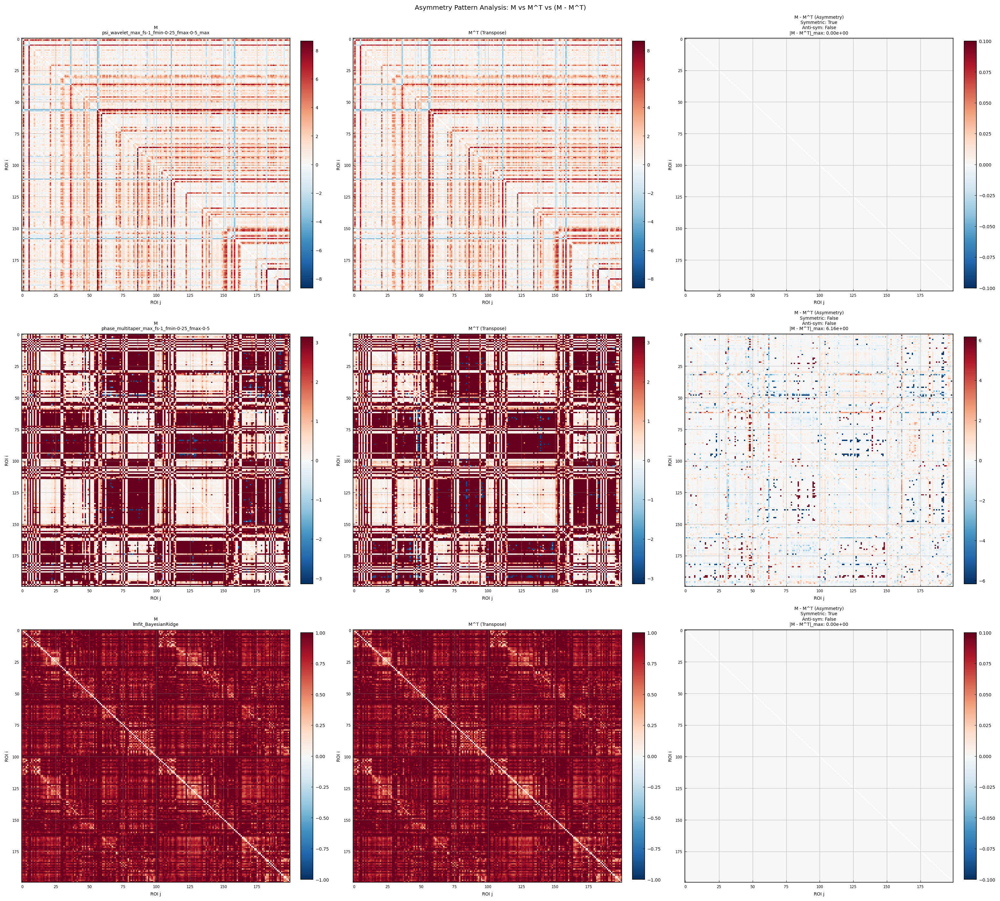

In [35]:
def analyze_symmetry_type(mat):
    """Analyze what type of symmetry/asymmetry a matrix has."""
    if mat.ndim == 1:
        n = int(np.sqrt(len(mat)))
        mat = mat.reshape(n, n)

    max_sym_error = np.nanmax(np.abs(mat - mat.T))
    max_antisym_error = np.nanmax(np.abs(mat + mat.T))
    mat_range = np.nanmax(mat) - np.nanmin(mat)

    norm_sym_error = max_sym_error / mat_range if mat_range > 1e-10 else 0
    norm_antisym_error = max_antisym_error / mat_range if mat_range > 1e-10 else 0

    return {
        'max_sym_error': max_sym_error,  # |M - M^T|
        'max_antisym_error': max_antisym_error,  # |M + M^T|
        'norm_sym_error': norm_sym_error,
        'norm_antisym_error': norm_antisym_error,
        'is_symmetric': is_matrix_symmetric(mat),
        'is_antisymmetric': is_matrix_antisymmetric(mat)
    }

# Check mismatched metrics for anti-symmetry
print("Checking for anti-symmetry in mismatched metrics:\n")

antisym_check_results = []

symmetric_computed_directed_doc = mismatches[
    (mismatches['computed_symmetric'] == True) &
    (mismatches['documented_symmetric'] == False)
]['func'].tolist()

nonsym_computed_undirected_doc = mismatches[
    (mismatches['computed_symmetric'] == False) &
    (mismatches['documented_symmetric'] == True)
]['func'].tolist()

test_metrics = symmetric_computed_directed_doc + nonsym_computed_undirected_doc

if test_metrics:
    # Batch fetch all in one parquet pass
    queries = [{"method": "pyspi", "func": m, "success": True} for m in test_metrics]
    batch_results = matrix_reader.batch_get_matrices(queries, limit=1, max_workers=8)
    prefetched = {m: mats for m, mats in zip(test_metrics, batch_results)}

    for metric in test_metrics:
        matrices = prefetched.get(metric, [])
        if matrices:
            mat = matrices[0]
            result = analyze_symmetry_type(mat)
            result['metric'] = metric
            antisym_check_results.append(result)

if antisym_check_results:
    antisym_df = pd.DataFrame(antisym_check_results)

    cols = ['metric', 'is_symmetric', 'is_antisymmetric',
            'norm_sym_error', 'norm_antisym_error',
            'max_sym_error', 'max_antisym_error']
    antisym_df = antisym_df[cols]

    print(antisym_df.to_string(index=False))
else:
    print("No results to display.")

# Visualize representative examples of each mismatch type
print("\nLoading representative matrices for visualization...\n")

# Select one example from each major pattern
examples = []

# Type 1: psi metrics (computed symmetric, documented directed)
psi_example = mismatches[
    (mismatches['computed_symmetric'] == True) &
    (mismatches['documented_symmetric'] == False) &
    (mismatches['category'] == 'psi')
]
if len(psi_example) > 0:
    examples.append({
        'metric': psi_example.iloc[0]['func'],
        'label': 'psi (Comp: Sym, Doc: Dir)'
    })

# Type 2: phase metrics (computed non-symmetric, documented undirected)
phase_example = mismatches[
    (mismatches['computed_symmetric'] == False) &
    (mismatches['documented_symmetric'] == True) &
    (mismatches['category'] == 'phase')
]
if len(phase_example) > 0:
    examples.append({
        'metric': phase_example.iloc[0]['func'],
        'label': 'phase (Comp: Non-sym, Doc: Undir)'
    })

# Type 3: lmfit metrics (computed symmetric, documented directed)
lmfit_example = mismatches[
    (mismatches['computed_symmetric'] == True) &
    (mismatches['documented_symmetric'] == False) &
    (mismatches['category'] == 'lmfit')
]
if len(lmfit_example) > 0:
    examples.append({
        'metric': lmfit_example.iloc[0]['func'],
        'label': 'lmfit (Comp: Sym, Doc: Dir)'
    })

n_examples = len(examples)

if n_examples > 0:
    # Batch fetch all examples in one parquet pass
    queries = [{"method": "pyspi", "func": e['metric'], "success": True} for e in examples]
    batch_results = matrix_reader.batch_get_matrices(queries, limit=1, max_workers=8)
    prefetched = {e['metric']: mats for e, mats in zip(examples, batch_results)}

    # Create 3-column plot for each example: M, M^T, M - M^T
    f, axes = plt.subplots(n_examples, 3,
                           figsize=(3 * 2 * PLOTW, n_examples * 1.8 * PLOTW),
                           layout="constrained")

    if n_examples == 1:
        axes = axes.reshape(1, -1)

    for row_idx, example in enumerate(examples):
        metric = example['metric']
        matrices = prefetched.get(metric, [])

        if matrices:
            mat = matrices[0]
            n = int(np.sqrt(len(mat)))
            mat = mat.reshape(n, n)

            sym_analysis = analyze_symmetry_type(mat)

            vmax = max(np.nanmax(np.abs(mat)), np.nanmax(np.abs(mat.T)))

            ax1 = axes[row_idx, 0]
            im1 = ax1.imshow(mat, cmap='RdBu_r', aspect='auto', vmin=-vmax, vmax=vmax)
            ax1.set_title(f'M\n{metric}', fontsize='small')
            ax1.set_xlabel('ROI j', fontsize='small')
            ax1.set_ylabel('ROI i', fontsize='small')
            ax1.tick_params(labelsize='x-small')
            plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

            ax2 = axes[row_idx, 1]
            im2 = ax2.imshow(mat.T, cmap='RdBu_r', aspect='auto', vmin=-vmax, vmax=vmax)
            ax2.set_title(f'M^T (Transpose)', fontsize='small')
            ax2.set_xlabel('ROI j', fontsize='small')
            ax2.set_ylabel('ROI i', fontsize='small')
            ax2.tick_params(labelsize='x-small')
            plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

            ax3 = axes[row_idx, 2]
            diff = mat - mat.T
            diff_max = np.nanmax(np.abs(diff))
            im3 = ax3.imshow(diff, cmap='RdBu_r', aspect='auto',
                             vmin=-diff_max, vmax=diff_max)

            title_lines = [
                f'M - M^T (Asymmetry)',
                f'Symmetric: {sym_analysis["is_symmetric"]}',
                f'Anti-sym: {sym_analysis["is_antisymmetric"]}',
                f'|M - M^T|_max: {sym_analysis["max_sym_error"]:.2e}'
            ]
            ax3.set_title('\n'.join(title_lines), fontsize='small')
            ax3.set_xlabel('ROI j', fontsize='small')
            ax3.set_ylabel('ROI i', fontsize='small')
            ax3.tick_params(labelsize='x-small')
            plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)

    f.suptitle('Asymmetry Pattern Analysis: M vs M^T vs (M - M^T)', fontsize='large')
    f.savefig(project_root / f"output/matrix_asymmetry_patterns.{FORMAT}",
              bbox_inches="tight", dpi=150)
    plt.show()
else:
    print("No examples to visualize.")

### Summary

In [36]:
if len(mismatches) > 0:
    print(f"\nTotal mismatches found: {len(mismatches)} (out of {len(pyspi_comparison_documented)} documented metrics)")
    
    # Group by type
    sym_computed_dir_doc = len(mismatches[
        (mismatches['computed_symmetric'] == True) & 
        (mismatches['documented_symmetric'] == False)
    ])
    dir_computed_sym_doc = len(mismatches[
        (mismatches['computed_symmetric'] == False) & 
        (mismatches['documented_symmetric'] == True)
    ])
    
    print(f"\n1. Computed SYMMETRIC but documented DIRECTED: {sym_computed_dir_doc} metrics")
    print(f"2. Computed NON-SYMMETRIC but documented UNDIRECTED: {dir_computed_sym_doc} metrics")
    
    # Most affected categories
    print("Affected SPI categories:")
    top_categories = mismatches['category'].value_counts().head(10)
    for cat, count in top_categories.items():
        cat_info = mismatches[mismatches['category'] == cat].iloc[0]
        print(f"  {cat}: {count} mismatches ({cat_info['Literature_category']})")


Total mismatches found: 32 (out of 136 documented metrics)

1. Computed SYMMETRIC but documented DIRECTED: 10 metrics
2. Computed NON-SYMMETRIC but documented UNDIRECTED: 22 metrics
Affected SPI categories:
  phase: 6 mismatches (spectral)
  pli: 6 mismatches (spectral)
  psi: 6 mismatches (spectral)
  wpli: 6 mismatches (spectral)
  lmfit: 4 mismatches (misc)
  tlmi: 3 mismatches (infotheory)
  ce: 1 mismatches (infotheory)


# Detect degenerate matrices

In [37]:
# Check for metrics that are both symmetric AND antisymmetric
print("Checking for impossible cases (both symmetric AND antisymmetric):\n")

both_sym_and_antisym = []
for key in symmetry_lookup.keys():
    is_sym = symmetry_lookup.get(key, False)
    is_antisym = antisymmetry_lookup.get(key, False)
    if is_sym and is_antisym:
        both_sym_and_antisym.append(key)

print(f"Metrics that are BOTH symmetric AND antisymmetric: {len(both_sym_and_antisym)}")
if len(both_sym_and_antisym) > 0:
    for key in both_sym_and_antisym:
        print(f"  {key}")

    keys_to_investigate = both_sym_and_antisym[:3]
    queries = [
        {"method": key.split("__")[0], "func": key.split("__")[1], "success": True}
        for key in keys_to_investigate
    ]
    batch_results = matrix_reader.batch_get_matrices(queries, limit=1, max_workers=8)
    prefetched = {key: mats for key, mats in zip(keys_to_investigate, batch_results)}

    for key in keys_to_investigate:
        matrices = prefetched.get(key, [])
        if matrices:
            mat = matrices[0]
            n = int(np.sqrt(len(mat)))
            mat = mat.reshape(n, n)

            print(f"\n{key}:")
            print(f"  Shape: {mat.shape}")
            print(f"  Range: [{np.nanmin(mat):.6f}, {np.nanmax(mat):.6f}]")
            print(f"  Mean: {np.nanmean(mat):.6f}")
            print(f"  Max |M - M^T|: {np.nanmax(np.abs(mat - mat.T)):.6e}")
            print(f"  Max |M + M^T|: {np.nanmax(np.abs(mat + mat.T)):.6e}")

            non_zero_count = np.sum(mat != 0)
            print(f"  Non-zero elements: {non_zero_count} / {mat.size}")

            unique_vals = np.unique(mat[~np.isnan(mat)])
            print(f"  Unique values: {len(unique_vals)}")
            if len(unique_vals) <= 10:
                print(f"  Values: {unique_vals}")
else:
    print("  None found - all metrics have consistent symmetry classification")

Checking for impossible cases (both symmetric AND antisymmetric):

Metrics that are BOTH symmetric AND antisymmetric: 1
  pyspi__bary_euclidean_mean

pyspi__bary_euclidean_mean:
  Shape: (200, 200)
  Range: [-0.000000, 0.000000]
  Mean: 0.000000
  Max |M - M^T|: 0.000000e+00
  Max |M + M^T|: 1.021405e-16
  Non-zero elements: 38624 / 40000
  Unique values: 280


In [38]:
# Investigate the "both symmetric and antisymmetric" case more deeply
key = "pyspi__bary_euclidean_mean"
method, func = key.split("__")
matrices = matrix_reader.get_matrices(method, func, success=True, limit=5)

print(f"Investigating {key} across multiple samples:\n")

for i, mat_arr in enumerate(matrices):
    mat = mat_arr.reshape(200, 200)
    print(f"Sample {i+1}:")
    print(f"  Min: {np.nanmin(mat):.2e}")
    print(f"  Max: {np.nanmax(mat):.2e}")
    print(f"  Abs max: {np.nanmax(np.abs(mat)):.2e}")
    print(f"  Std: {np.nanstd(mat):.2e}")
    print()

Investigating pyspi__bary_euclidean_mean across multiple samples:

Sample 1:
  Min: -4.88e-17
  Max: 5.11e-17
  Abs max: 5.11e-17
  Std: 1.42e-17

Sample 2:
  Min: -5.22e-17
  Max: 5.44e-17
  Abs max: 5.44e-17
  Std: 1.35e-17

Sample 3:
  Min: -5.00e-17
  Max: 5.22e-17
  Abs max: 5.22e-17
  Std: 1.42e-17

Sample 4:
  Min: -5.11e-17
  Max: 4.44e-17
  Abs max: 5.11e-17
  Std: 1.31e-17

Sample 5:
  Min: -5.33e-17
  Max: 4.66e-17
  Abs max: 5.33e-17
  Std: 1.25e-17



In [39]:
# Fix the lookups: Remove degenerate matrices from antisymmetry lookup
# A zero matrix is trivially symmetric, but marking it as antisymmetric is misleading

# Define thresholds for degenerate matrix detection
ZERO_THRESHOLD = 1e-10  # Threshold for "essentially zero" matrix
MIN_UNIQUE_VALUES = 2   # Only exclude constant matrices (single unique value)
                        # Metrics with few discrete values (e.g., PLI_max with {-1, 0, 1}) 
                        # are still informative and should NOT be excluded

# Batch-fetch all matrices in a single parquet pass
all_keys = list(symmetry_lookup.keys())
queries = [
    {"method": key.split("__")[0], "func": key.split("__")[1], "success": True}
    for key in all_keys
]
print(f"Batch-fetching matrices for {len(queries)} combinations...")
all_matrices_batch = matrix_reader.batch_get_matrices(queries, limit=5, max_workers=8)
print("Done.")

# Check all metrics for zero/degenerate matrices
degenerate_metrics = []
degenerate_reasons = {}

for key, matrices in zip(all_keys, all_matrices_batch):
    is_sym = symmetry_lookup.get(key, False)
    is_antisym = antisymmetry_lookup.get(key, False)

    if not matrices:
        continue

    reasons = []

    # Check multiple matrices for consistency
    for mat in matrices:
        # Check 1: All values essentially zero
        max_abs = np.nanmax(np.abs(mat))
        if max_abs < ZERO_THRESHOLD:
            if "all_zeros" not in reasons:
                reasons.append("all_zeros")

        # Check 2: Constant matrix (single unique value = no variation)
        # Note: metrics with few discrete values (2-10) are still informative
        # Flatten and remove NaN
        flat = mat.flatten()
        flat_valid = flat[~np.isnan(flat)]
        unique_vals = np.unique(flat_valid)

        if len(unique_vals) < MIN_UNIQUE_VALUES:
            if "constant_value" not in reasons:
                reasons.append(f"constant_value ({unique_vals[0]:.4f})" if len(unique_vals) == 1 else "constant_value")

    # If any degenerate condition is met
    if reasons:
        degenerate_metrics.append(key)
        degenerate_reasons[key] = reasons

        # Fix: Remove from antisymmetry lookup (keep in symmetry only if truly symmetric)
        if is_sym and is_antisym:
            antisymmetry_lookup[key] = False

print(f"Degenerate matrices found: {len(degenerate_metrics)}")
print(f"\nDegenerate metrics by reason:")
for key in sorted(degenerate_metrics):
    reasons = degenerate_reasons[key]
    print(f"  {key}: {', '.join(reasons)}")

# Re-save the corrected antisymmetry lookup
with open(antisymmetry_output_path, 'w') as f:
    json.dump(antisymmetry_lookup, f, indent=2)
print(f"\nUpdated antisymmetry lookup saved to: {antisymmetry_output_path}")

# Verify no more overlaps
overlaps_after = sum(1 for k in symmetry_lookup if symmetry_lookup[k] and antisymmetry_lookup.get(k, False))
print(f"\nOverlapping classifications after fix: {overlaps_after}")

Batch-fetching matrices for 161 combinations...
Done.
Degenerate matrices found: 2

Degenerate metrics by reason:
  pyspi__bary_euclidean_mean: all_zeros
  pyspi__lmfit_Lasso: constant_value (1.0000), constant_value (1.0000), constant_value (1.0000), constant_value (1.0000), constant_value (1.0000)

Updated antisymmetry lookup saved to: /home/aerkent/skarf-experiments/resources/matrix_antisymmetry_lookup.json

Overlapping classifications after fix: 0


In [46]:
# Create and save degenerate matrix lookup
degenerate_lookup = {key: (key in degenerate_metrics) for key in symmetry_lookup.keys()}

degenerate_output_path = project_root / "resources/matrix_degenerate_lookup.json"
with open(degenerate_output_path, 'w') as f:
    json.dump(degenerate_lookup, f, indent=2)

print(f"Created degenerate matrix lookup with {sum(degenerate_lookup.values())} degenerate metrics")
print(f"Saved to: {degenerate_output_path}")

n_symmetric = sum(symmetry_lookup.values())
n_antisymmetric = sum(antisymmetry_lookup.values())
n_degenerate = sum(degenerate_lookup.values())
n_total = len(symmetry_lookup)
n_general = n_total - n_symmetric - n_antisymmetric  # degenerate already removed from antisym

print(f"""
Matrix structure distribution:
  • Symmetric (M = M^T):       {n_symmetric:3d} metrics ({100*n_symmetric/n_total:.1f}%)
  • Antisymmetric (M = -M^T):  {n_antisymmetric:3d} metrics ({100*n_antisymmetric/n_total:.1f}%)
  • General asymmetric:        {n_general:3d} metrics ({100*n_general/n_total:.1f}%)
  • Degenerate (excluded):     {n_degenerate:3d} metrics ({100*n_degenerate/n_total:.1f}%)

Degenerate detection criteria:
  • All values essentially zero (max|M| < {ZERO_THRESHOLD})
  • Constant matrix (single unique value = no inter-edge variation)
  
Note: Metrics with few discrete values (e.g., PLI_max with 2-5 values) are NOT 
excluded, they still contain meaningful information about phase relationships.

Degenerate metrics list:
""")
for key in sorted(degenerate_metrics):
    reasons = degenerate_reasons[key]
    print(f"  • {key}: {', '.join(reasons)}")

print(f"""
Output files:
  • resources/matrix_symmetry_lookup.json
  • resources/matrix_antisymmetry_lookup.json
  • resources/matrix_degenerate_lookup.json
""")

Created degenerate matrix lookup with 2 degenerate metrics
Saved to: /home/aerkent/skarf-experiments/resources/matrix_degenerate_lookup.json

Matrix structure distribution:
  • Symmetric (M = M^T):       104 metrics (64.6%)
  • Antisymmetric (M = -M^T):   13 metrics (8.1%)
  • General asymmetric:         44 metrics (27.3%)
  • Degenerate (excluded):       2 metrics (1.2%)

Degenerate detection criteria:
  • All values essentially zero (max|M| < 1e-10)
  • Constant matrix (single unique value = no inter-edge variation)
  
Note: Metrics with few discrete values (e.g., PLI_max with 2-5 values) are NOT 
excluded, they still contain meaningful information about phase relationships.

Degenerate metrics list:

  • pyspi__bary_euclidean_mean: all_zeros
  • pyspi__lmfit_Lasso: constant_value (1.0000), constant_value (1.0000), constant_value (1.0000), constant_value (1.0000), constant_value (1.0000)

Output files:
  • resources/matrix_symmetry_lookup.json
  • resources/matrix_antisymmetry_lookup